In [1]:
from deepforest import main
from deepforest import get_data
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime

In [10]:
model = main.deepforest()
model.use_release()

Reading config file: /Users/jacobsieradzki/miniconda3/envs/mlp/lib/python3.9/site-packages/deepforest/data/deepforest_config.yml
Model from DeepForest release https://github.com/weecology/DeepForest/releases/tag/1.0.0 was already downloaded. Loading model from file.
Loading pre-built model: https://github.com/weecology/DeepForest/releases/tag/1.0.0


In [26]:
def perform(img_path, new_path=None):
  img = model.predict_image(path=img_path, return_plot=True)
  if new_path:
    plt.imsave(new_path, img)

  #predict_image returns plot in BlueGreenRed (opencv style), but matplotlib likes RedGreenBlue, switch the channel order.
  plt.figure(figsize = (10,10))
  plt.imshow(img[:,:,::-1])


def run_in_dir(input_dir, output_dir):
  filenames = [f for f in os.listdir(input_dir) if os.path.isfile(os.path.join(input_dir, f)) and f.endswith('.png')]
  filenames.sort()
  for filename in filenames[0:20]:
    print('>>> Performing...', filename)
    t1 = datetime.now()
    perform(input_dir + filename, output_dir + filename)
    duration = datetime.now() - t1
    print('Done in ' + str(duration) + 's')

>>> Performing... 55.939567000000004_-3.1874391567396_zl20.png
Done in 0:00:04.514781s
>>> Performing... 55.939567000000004_-3.1881245169112_zl20.png
Done in 0:00:04.328916s
>>> Performing... 55.939567000000004_-3.1888098770828_zl20.png
Done in 0:00:04.528621s
>>> Performing... 55.939567000000004_-3.1894952372543997_zl20.png
Done in 0:00:04.548168s
>>> Performing... 55.939567000000004_-3.190180597426_zl20.png
Done in 0:00:04.475393s
>>> Performing... 55.939567000000004_-3.1908659575976_zl20.png
Done in 0:00:04.503540s
>>> Performing... 55.939567000000004_-3.1915513177692_zl20.png
Done in 0:00:04.485660s
>>> Performing... 55.939567000000004_-3.1922366779408_zl20.png
Done in 0:00:04.516430s
>>> Performing... 55.939567000000004_-3.1929220381123997_zl20.png
Done in 0:00:04.535846s
>>> Performing... 55.939567000000004_-3.193607398284_zl20.png
Done in 0:00:04.775650s
>>> Performing... 55.939567000000004_-3.1942927584555996_zl20.png
Done in 0:00:04.619929s
>>> Performing... 55.939567000000004

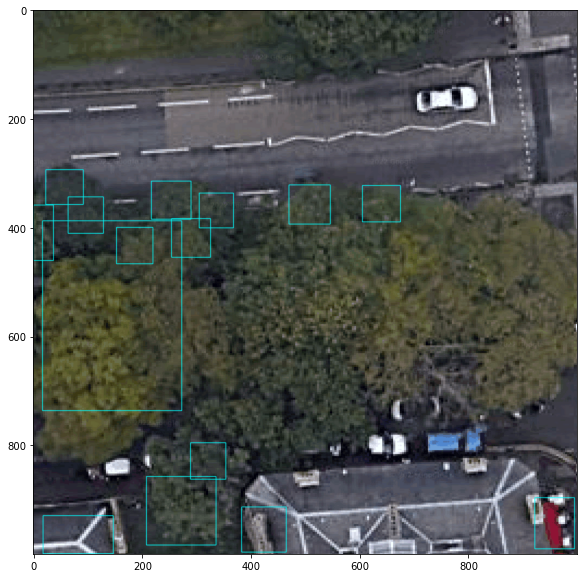

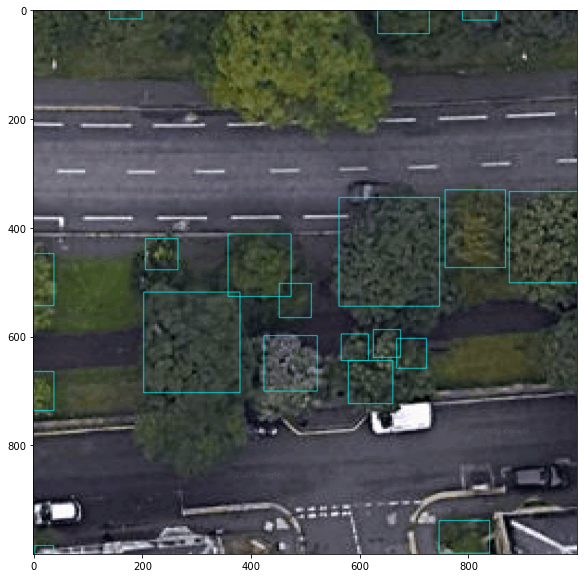

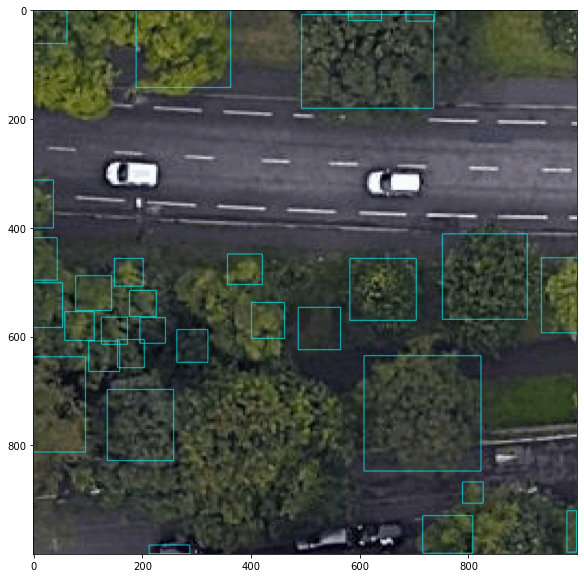

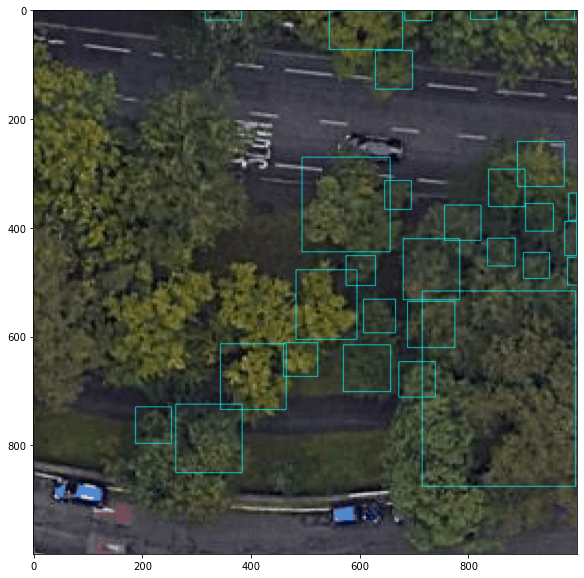

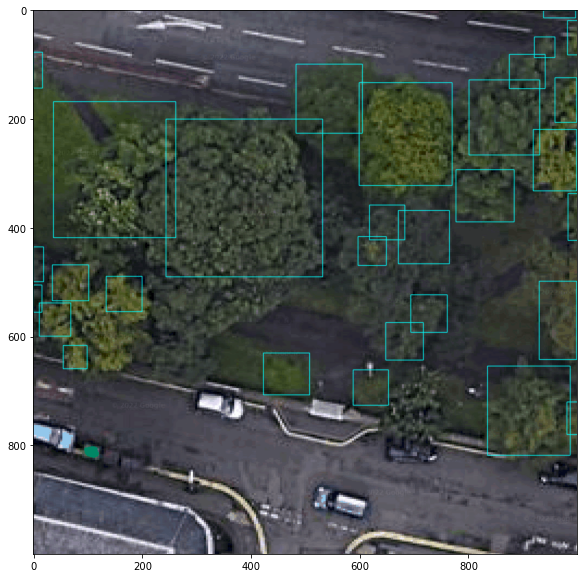

...

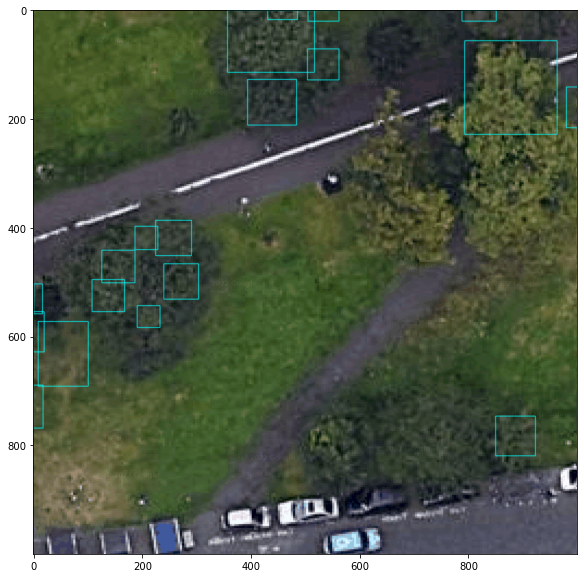

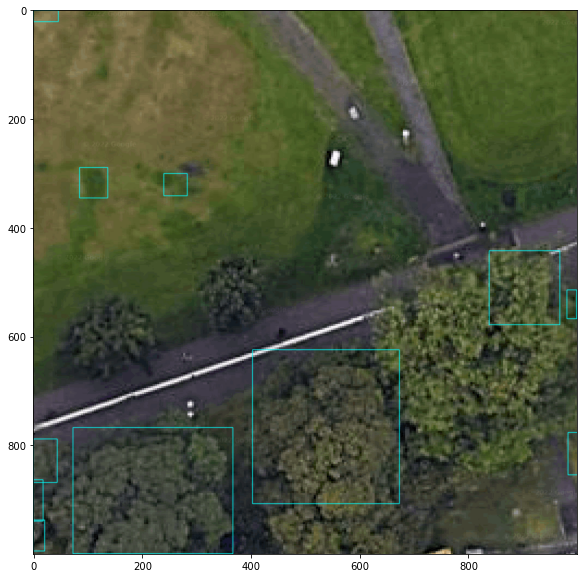

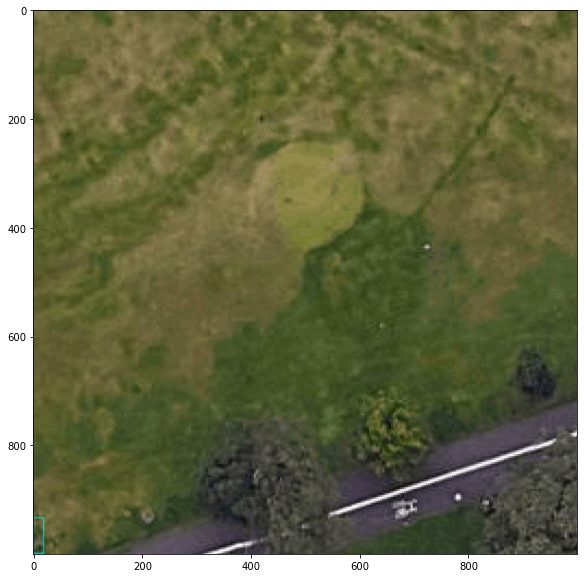

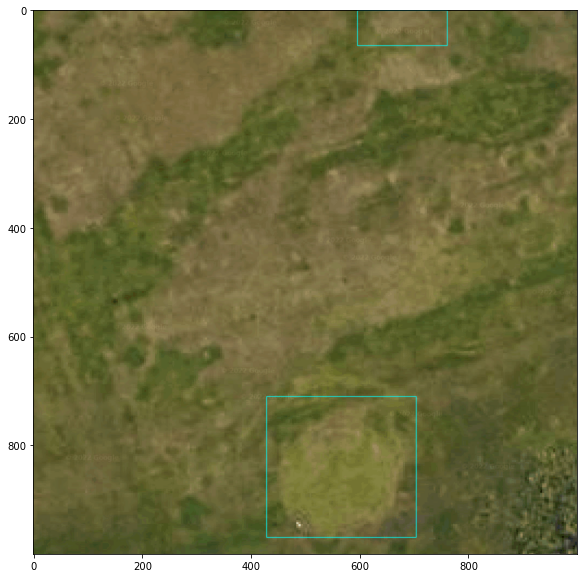

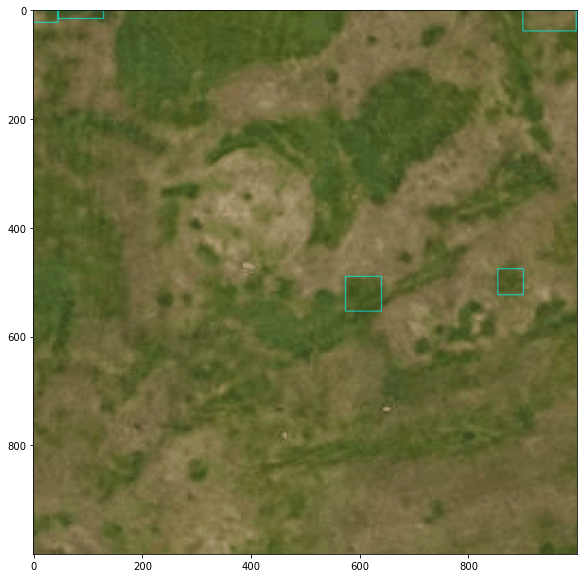

In [24]:
ORIGINAL_DIR = "./tests/meadows/crop_tiles/"
NEW_DIR = "./tests/meadows/deep_forest/"

run_in_dir(ORIGINAL_DIR, NEW_DIR)
